In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import tensorflow as tf

In [2]:
# Vehicle_Dataset folder
Vehicle_Dataset = 'Dataset/'

In [3]:
import os

labels = sorted(os.listdir(Vehicle_Dataset))
labels

['Bus', 'Car', 'Truck', 'motorcycle']

In [4]:
num_Vehicle = [len(os.listdir(os.path.join(Vehicle_Dataset + label))) for label in labels]
Vehicle_df = pd.DataFrame({'labels':labels, 'num_Vehicle':num_Vehicle})
print(Vehicle_df.shape)
Vehicle_df

(4, 2)


,labels,num_Vehicle
0,Bus,100
1,Car,100
2,Truck,100
3,motorcycle,100


In [5]:
import pathlib 
from glob import glob

path = ''
data_dir = pathlib.Path(path)

In [6]:
import cv2

def read_image(path):
    image = cv2.imread(path, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

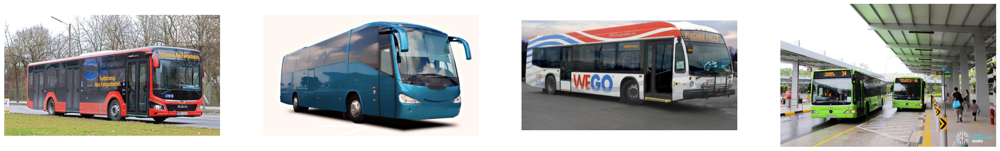

Bus


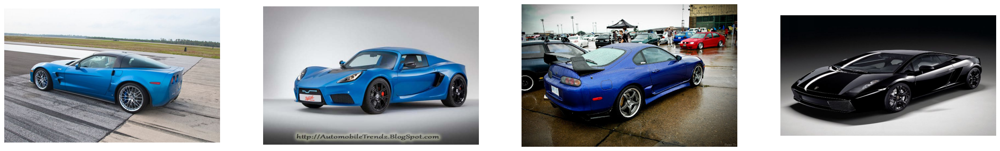

Car


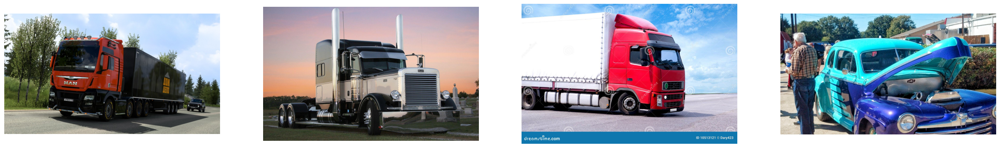

Truck


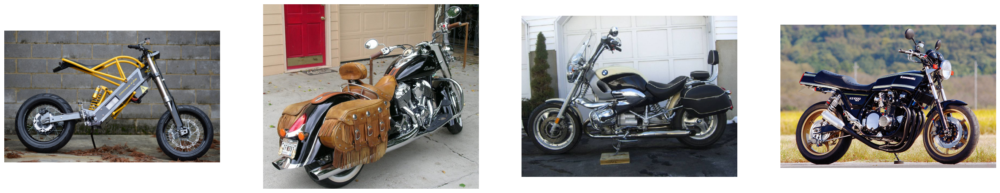

motorcycle


In [7]:
for label in labels:
    f, ax = plt.subplots(figsize=(30,10))
    files = glob('{}/Dataset/{}/*.*'.format(data_dir, label))
    ax.remove() 
    
    for x in range(4):
        plt.subplot(1, 4, x+1)
        image = read_image(files[x])
        plt.imshow(image)
        plt.axis('off')
        
    plt.show()
    print(label)

In [8]:
# Intialize Generator 
import keras
from keras.preprocessing.image import ImageDataGenerator as ImgDataGen

gen = ImgDataGen(rescale=1./255, rotation_range=20, horizontal_flip=True, validation_split=0.1)

# Load Data 
train_ds = gen.flow_from_directory(Vehicle_Dataset, 
                                   class_mode='binary', shuffle=True, batch_size=32, color_mode='rgb',
                                   target_size=(256,256), subset='training')
valid_ds = gen.flow_from_directory(Vehicle_Dataset, 
                                   class_mode='binary', shuffle=True, batch_size=32, color_mode='rgb', 
                                   target_size=(256,256), subset='validation')

Found 360 images belonging to 4 classes.
Found 40 images belonging to 4 classes.


In [9]:
from tensorflow.keras.applications import InceptionV3
from keras.models import Sequential
from keras.layers import GlobalAvgPool2D as GAP, Dense, Dropout
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Load Pretrained InceptionV3 Model
base_model = InceptionV3(include_top=False, input_shape=(256,256,3))

# Freeze Weights
base_model.trainable = False

# base_model.summary()


2023-10-22 23:14:01.677248: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-22 23:14:06.423923: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38258 MB memory:  -> device: 0, name: NVIDIA A100-SXM4-40GB, pci bus id: 0000:4e:00.0, compute capability: 8.0


In [10]:
# Model Architecture
model = Sequential([
    base_model,
    GAP(),
    Dense(256, activation='relu', kernel_initializer='he_normal'),
    Dropout(0.4),
    Dense(len(labels), activation='softmax')], name="Inception-TL")

model.summary()

Model: "Inception-TL"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 256)               524544    
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 4)                 1028      
                                                                 
Total params: 22,328,356
Trainable params: 525,572
Non-trainable params: 21,802,784
____________________________________

In [11]:
# Compile Model 
model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

In [12]:
# Callbacks 
cbs = [EarlyStopping(patience=3, restore_best_weights=True)]

# Model Training
history = model.fit(train_ds, validation_data=valid_ds, epochs=10, callbacks= cbs)

Epoch 1/10


2023-10-22 23:14:14.903592: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100


 1/12 [=>............................] - ETA: 1:45 - loss: 1.4668 - accuracy: 0.4375

2023-10-22 23:14:20.027960: I tensorflow/stream_executor/cuda/cuda_blas.cc:1786] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


 5/12 [===========>..................] - ETA: 4s - loss: 0.7844 - accuracy: 0.7563

/home/dip_38/miniconda3/envs/jupyter/lib/python3.9/site-packages/PIL/Image.py:970: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


12/12 [==============================] - 21s 1s/step - loss: 0.4742 - accuracy: 0.8472 - val_loss: 0.1107 - val_accuracy: 0.9500
Epoch 2/10
12/12 [==============================] - 10s 803ms/step - loss: 0.1982 - accuracy: 0.9444 - val_loss: 0.2379 - val_accuracy: 0.9250
Epoch 3/10
12/12 [==============================] - 10s 827ms/step - loss: 0.1734 - accuracy: 0.9389 - val_loss: 0.0696 - val_accuracy: 0.9750
Epoch 4/10
12/12 [==============================] - 10s 851ms/step - loss: 0.1026 - accuracy: 0.9583 - val_loss: 0.1085 - val_accuracy: 0.9500
Epoch 5/10
12/12 [==============================] - 10s 784ms/step - loss: 0.0954 - accuracy: 0.9694 - val_loss: 0.0618 - val_accuracy: 0.9750
Epoch 6/10
12/12 [==============================] - 10s 860ms/step - loss: 0.0676 - accuracy: 0.9750 - val_loss: 0.0998 - val_accuracy: 0.9750
Epoch 7/10
12/12 [==============================] - 10s 810ms/step - loss: 0.0732 - accuracy: 0.9722 - val_loss: 0.1098 - val_accuracy: 0.9250
Epoch 8/10
12

Text(0.5, 1.0, 'Accuracy Vs Epoch')

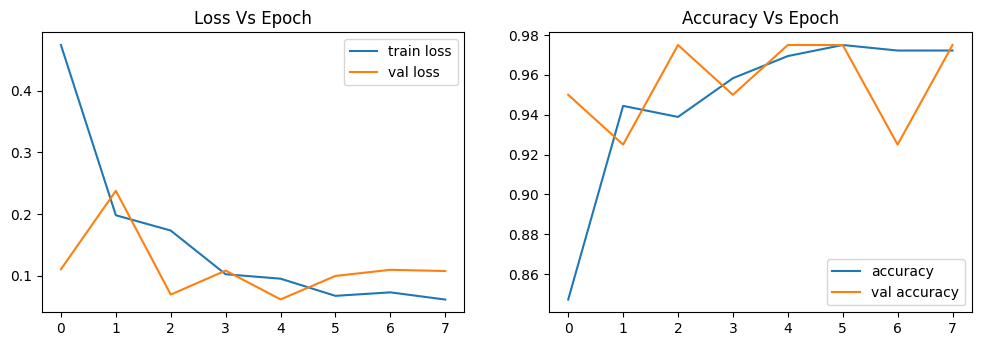

In [13]:
# Model estimation

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(history.history['loss'], label='train loss')
plt.plot(history.history['val_loss'], label='val loss')
plt.legend()
plt.title('Loss Vs Epoch')

plt.subplot(2, 2, 2)
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val accuracy')
plt.legend()
plt.title('Accuracy Vs Epoch')

1/1 [==============================] - 0s 28ms/step


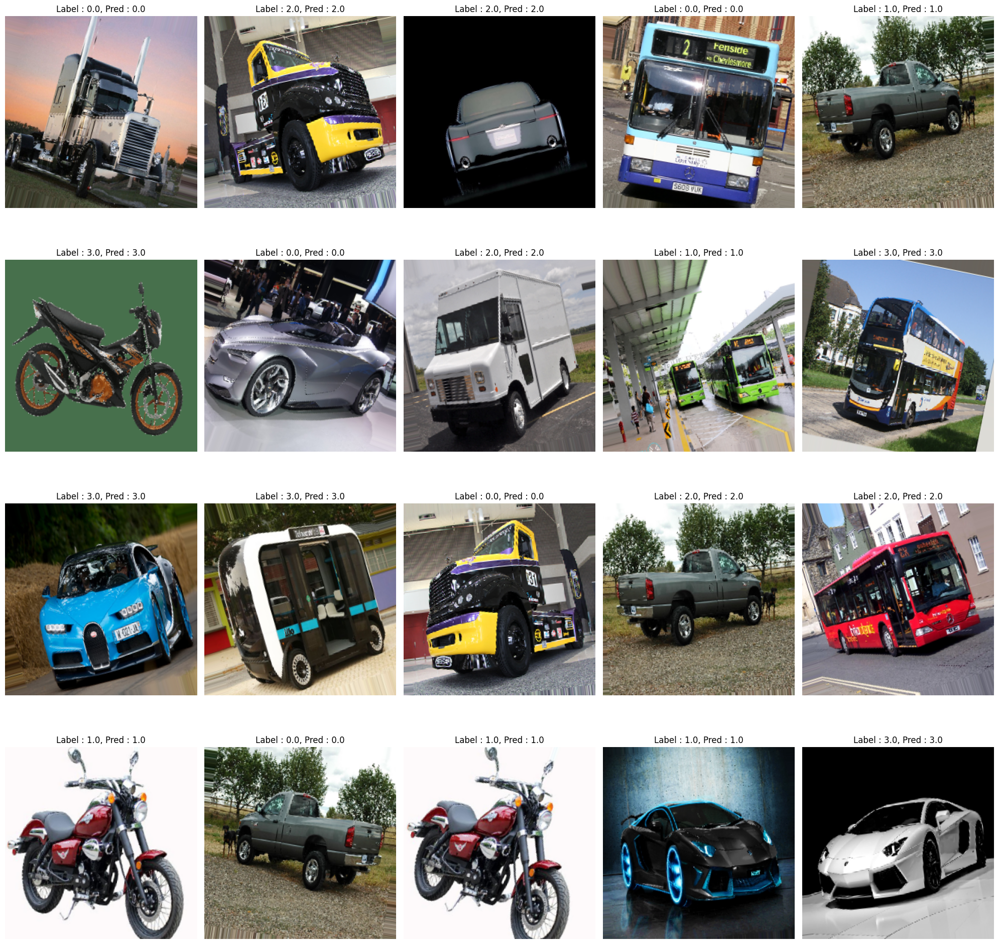

In [14]:
i = 1
plt.figure(figsize=(20, 20))
for images, labels in valid_ds:

    id = np.random.randint(len(images))
    image, label = images[id], labels[id]
    pred_label = np.argmax(model.predict(image.reshape(-1, 256, 256, 3)))

    plt.subplot(4, 5, i)
    plt.imshow(image)
    plt.title(f"Label : {labels[int(label)]}, Pred : {labels[int(pred_label)]}")
    plt.axis('off')

    i += 1
    if i >= 21:
        break
plt.tight_layout()
plt.show()